# Setup

In [8]:
!wget https://raw.githubusercontent.com/zb-umkc/mot/refs/heads/main/config.py
!wget https://raw.githubusercontent.com/zb-umkc/mot/refs/heads/main/detector.py
!wget https://raw.githubusercontent.com/zb-umkc/mot/refs/heads/main/reid.py
!wget https://raw.githubusercontent.com/zb-umkc/mot/refs/heads/main/tracker.py
!wget https://raw.githubusercontent.com/zb-umkc/mot/refs/heads/main/visuals.py

In [1]:
from detector import *
from reid import *
from tracker import *
from visuals import *
from config import *

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Object Detection

### Examples of data augmentation

Raw: [torch.Size([3, 1080, 1920]), torch.Size([3, 1080, 1920]), torch.Size([3, 1080, 1920])]
Color: [torch.Size([3, 1080, 1920]), torch.Size([3, 1080, 1920]), torch.Size([3, 1080, 1920])]
Gaussian Blur: [torch.Size([3, 1080, 1920]), torch.Size([3, 1080, 1920]), torch.Size([3, 1080, 1920])]
Motion Blur: [torch.Size([3, 1080, 1920]), torch.Size([3, 1080, 1920]), torch.Size([3, 1080, 1920])]
Gray: [torch.Size([3, 1080, 1920]), torch.Size([3, 1080, 1920]), torch.Size([3, 1080, 1920])]


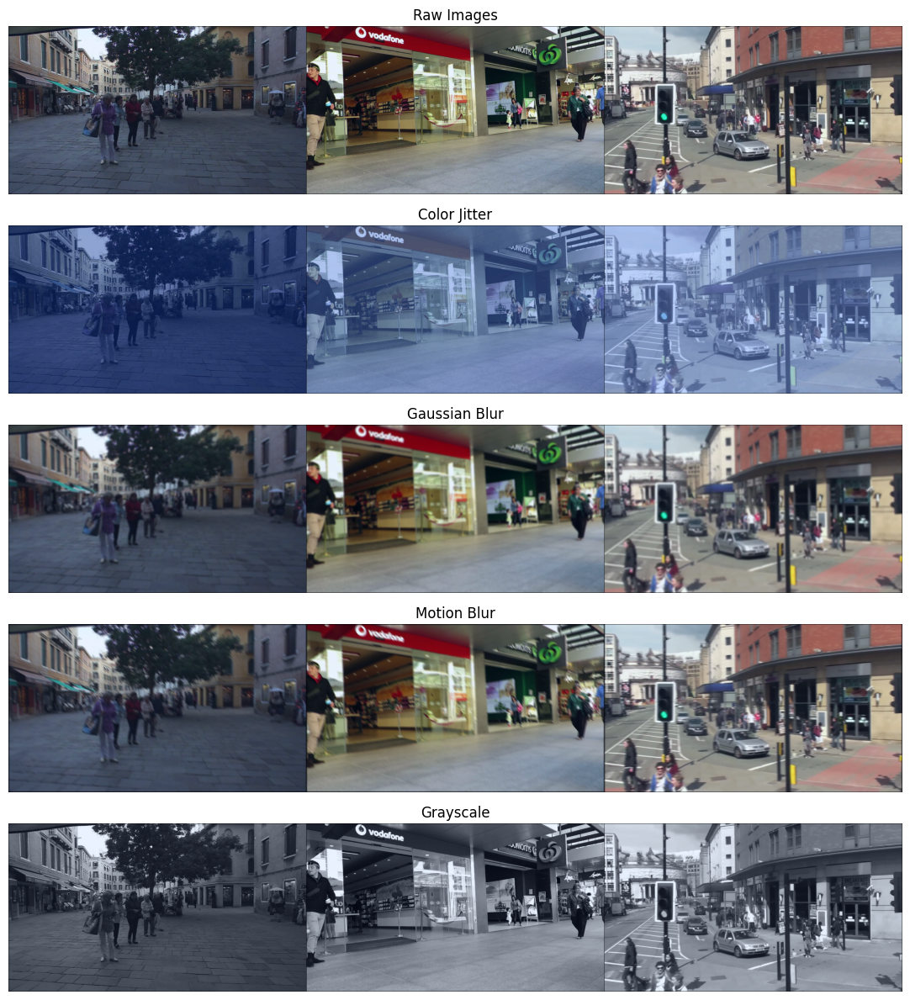

In [ ]:
demo_augmentation()

### Train detection model

In [9]:
train_detection_model()

### Load pre-trained detection model

In [2]:
detection_model = load_trained_detection_model(filename=ckpt_filename_det)

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 214MB/s]


# Object Re-Identification

### Demonstrate positive/negative pairs for re-ID data

torch.Size([224, 224, 3])
torch.Size([224, 224, 3])
tensor([1.])


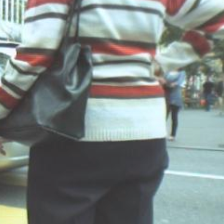

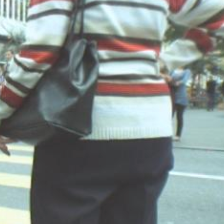

torch.Size([224, 224, 3])
torch.Size([224, 224, 3])
tensor([0.])


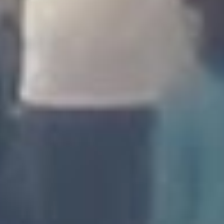

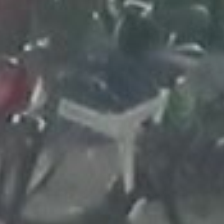

In [12]:
# Pos = view of same object from nearby frame
demo_reid_pairs(type="pos")

# Neg = view of different object from nearby frame
demo_reid_pairs(type="neg")

### Train re-ID model

In [13]:
train_reid_model()

### Load pre-trained re-ID model

In [3]:
reid_model = load_trained_reid_model(filename=ckpt_filename_reid)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


# Inference/Prediction

### Run inference on a video

In [4]:
seq_name = "MOT16-01"
preds_df = run_inference(seq_name, detection_model, reid_model)

print(preds_df.shape)
preds_df.head()

  0%|          | 0/450 [00:00<?, ?it/s]

(7389, 6)


,frame_id,obj_id,x1,y1,x2,y2
0,1,1,765,459,812,588
1,1,2,876,497,909,584
2,1,3,714,466,757,586
3,1,4,669,458,696,548
4,1,5,910,493,944,587


### Show a few example frames with predictions

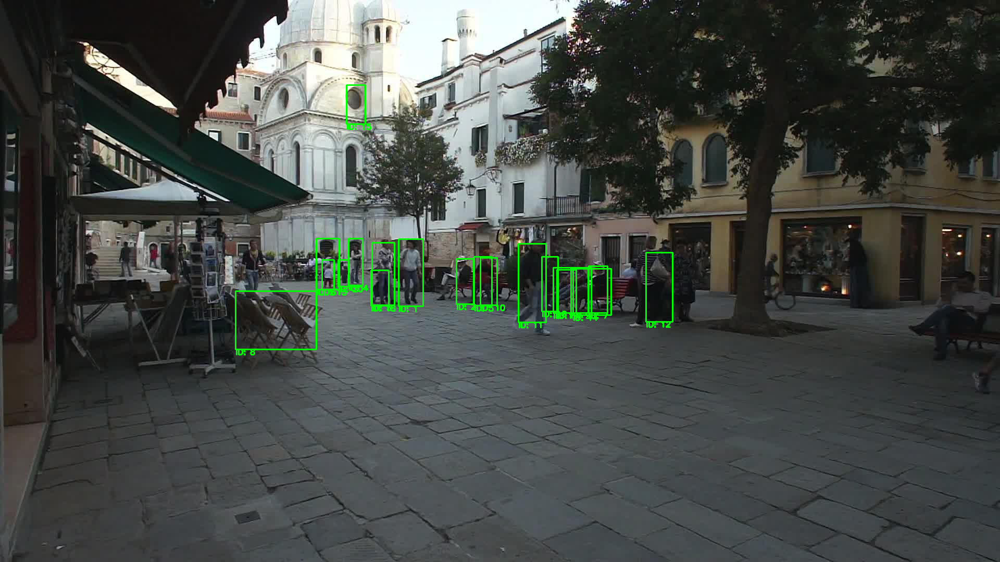

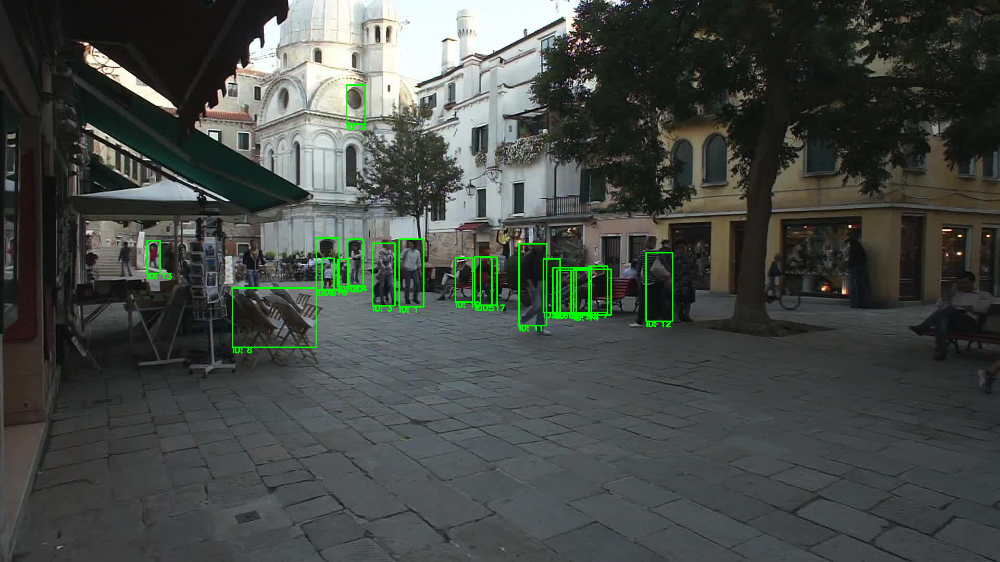

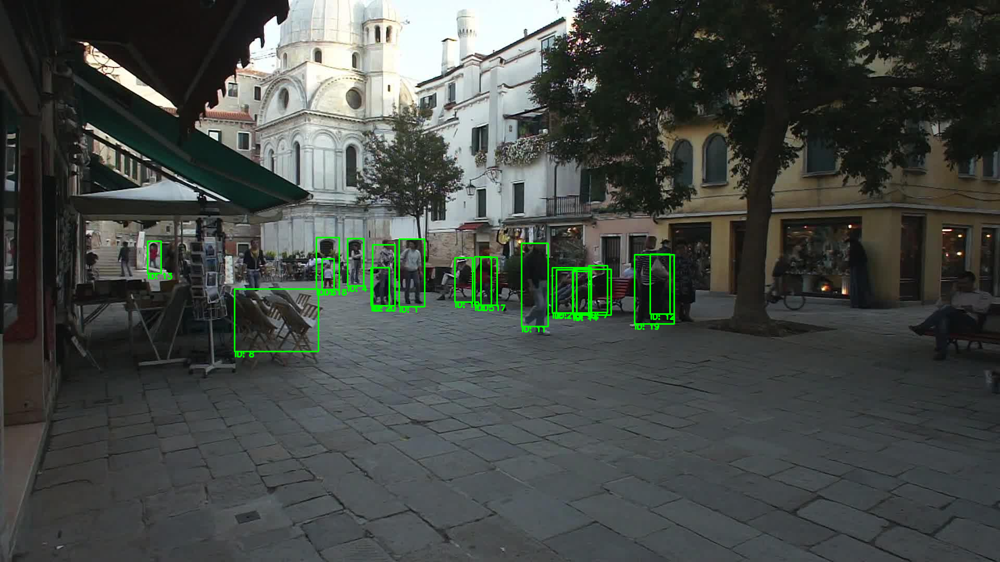

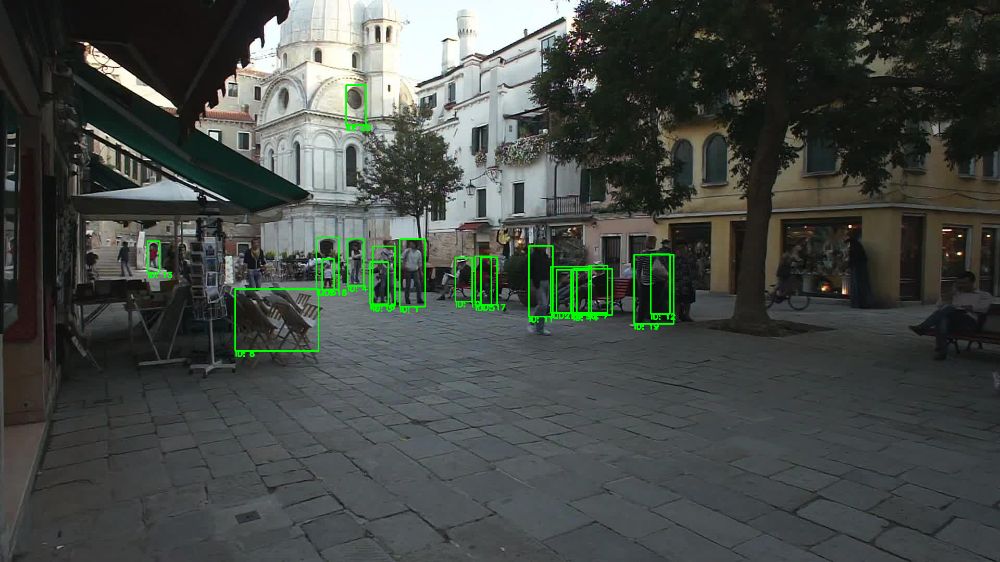

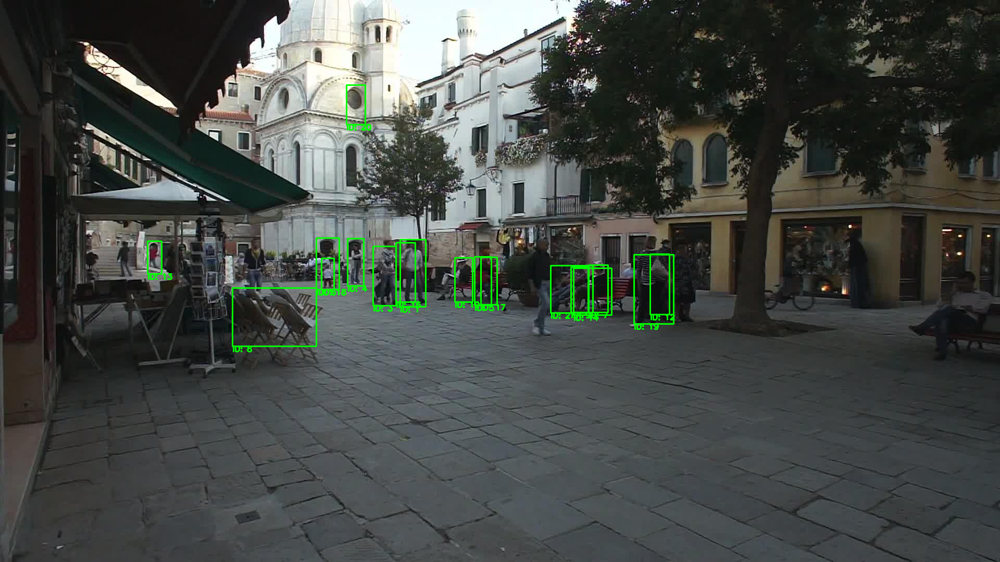

In [5]:
for i in range(1, 6):
    display_frame(data_dir=data_dir_test, seq="MOT16-01", frame_id=i, boxes=preds_df, label_loc="bottom")

### Generate video with predictions

In [14]:
for seq_name in tqdm(["MOT16-01", "MOT16-03", "MOT16-06", "MOT16-07", "MOT16-08", "MOT16-12", "MOT16-14"]):
    preds_df = run_inference(seq_name, detection_model, reid_model)
    output_file = f"{base_dir}/{seq_name}.mp4"
    data_loader, _ = create_detection_datasets(mode="test", seq_name=seq_name)
    dim = img_res[seq_name]
    generate_video(data_loader=data_loader, boxes=preds_df, output_file=output_file, dim=dim, label_loc="middle")